<a href="https://colab.research.google.com/github/sridevibonthu/EVA/blob/master/S12/S12_Assignment_trail_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [0]:
!git clone https://github.com/sridevibonthu/EVALibrary.git
import sys
sys.path.append("/content/EVALibrary/EVA4")

Cloning into 'EVALibrary'...
remote: Enumerating objects: 94, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 94 (delta 31), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (94/94), done.


In [0]:
import random
from tqdm.notebook import tqdm, trange

# Dataset and Creating Train/Test Split

Get the imagenet dataset

In [0]:
! git clone https://github.com/seshuad/IMagenet

Cloning into 'IMagenet'...
remote: Enumerating objects: 120594, done.
remote: Total 120594 (delta 0), reused 0 (delta 0), pack-reused 120594
Receiving objects: 100% (120594/120594), 212.68 MiB | 11.28 MiB/s, done.
Resolving deltas: 100% (1115/1115), done.
Checking out files: 100% (120206/120206), done.


Create 70/30 split after combining train/test
We have separately calculated the mean/std or we can use 0.5s

In [0]:
path = 'IMagenet/tiny-imagenet-200/'
class_ids = [line.strip() for line in open( path + 'wnids.txt', 'r')]
id_dict = {x:i for i, x in enumerate(class_ids)}
all_classes = {line.split('\t')[0] : line.split('\t')[1].strip() for line in open( path + 'words.txt', 'r')}
class_names = [all_classes[x] for x in class_ids]

images = []
labels = []

# train data
for value, key in tqdm(enumerate(class_ids)):
  images += [f'{path}train/{key}/images/{key}_{i}.JPEG' for i in range(500)]
  labels += [value for i in range(500)]

# validation data
for line in tqdm(open( path + 'val/val_annotations.txt')):
    img_name, class_id = line.split('\t')[:2]
    images.append(f'{path}val/images/{img_name}')
    labels.append(id_dict[class_id])

dataset = list(zip(images, labels))
random.shuffle(dataset)
trainlen = int(len(dataset)*0.7)
print(len(dataset), trainlen)


110000 77000


### Create DataSet

In [0]:
import torch
from skimage import io
import numpy as np
from torch.utils.data import Dataset

class TinyImagenetDataset(Dataset):
    """Face Landmarks dataset."""

    def __init__(self, data, transform=None):
        """
        Args:
            data (string): zipped images and labels.
        """
        self.transform = transform
        self.images, self.labels = zip(*data)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        image = io.imread(self.images[idx], as_gray=False, pilmode="RGB")
        # We don't want one hot encoding here
        # https://pytorch.org/docs/master/nn.functional.html#torch.nn.functional.nll_loss
        #label = np.array([0]*200)
        #label[self.labels[idx]] = 1

        if self.transform:
            image = self.transform(image)
        return image, self.labels[idx] #label

## Data collection and Prep

Get the Albumentations library

In [0]:
!pip install -U git+https://github.com/albu/albumentations > /dev/null && echo "All libraries are successfully installed!"

  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-ta2vsf_2
All libraries are successfully installed!


## Data Transformations

We first start with defining our data transformations. 

* padding of 8 pixels on each side (we are padding by mean)
* RandomCrop 64, 64 (after padding)
* Rotaion
* FlipLR
* Followed by CutOut(8, 8) 8 times


In [0]:
import cv2
import numpy as np
from eva4datatransforms import AlbumentationTransforms
import albumentations as A
from torchvision import transforms
# The values here are elsewhere calculated
channel_means = (0.48043839, 0.44820218, 0.39760034)
channel_stdevs = (0.27698959, 0.26908774, 0.28216029)
# Train Phase transformations
train_transforms = AlbumentationTransforms([
                                      A.PadIfNeeded(min_height=80, min_width=80, border_mode=cv2.BORDER_CONSTANT, value=np.array(channel_means)*255),
                                      A.RandomCrop(64,64, always_apply=True),
                                      A.Rotate((-30.0, 30.0)),
                                      A.HorizontalFlip(),
                                      #A.RGBShift(r_shift_limit=50, g_shift_limit=50, b_shift_limit=50, p=0.5),
                                      A.Normalize(mean=channel_means, std=channel_stdevs),
                                      A.Cutout(num_holes=8, max_h_size=8, max_w_size=8) # fillvalue is 0 after normalizing as mean is 0
                                    ])

fillmeans = (np.array(channel_means)).astype(np.uint8)

# Test Phase transformations
test_transforms = AlbumentationTransforms([A.Normalize(mean=channel_means, std=channel_stdevs)])



In [0]:
train = TinyImagenetDataset(dataset[:trainlen], transform=train_transforms)
test = TinyImagenetDataset(dataset[trainlen:], transform=test_transforms)

In [0]:
print(len(train), len(test))

77000 33000


# Dataloader Arguments & Test/Train Dataloaders

### Batch Size - 256


In [0]:
import eva4dataloaders
batch_size=256

dataloader = eva4dataloaders.DataLoader(batch_size=batch_size, shuffle=True)

# train dataloader
train_loader = dataloader.load(train)

# test dataloader
test_loader = dataloader.load(test)

# Data Statistics

It is important to know your data very well. Let's check some of the statistics around our data and how it actually looks like

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([256, 3, 64, 64])
torch.Size([256])
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)


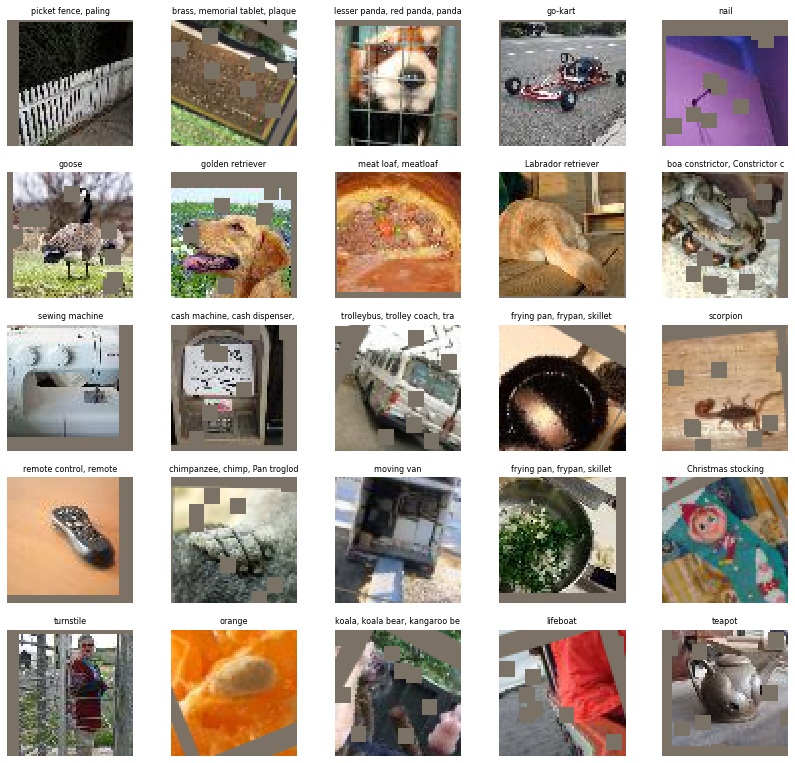

In [0]:
from __future__ import print_function
def unnormalize(img):
  img = img.cpu().numpy().astype(dtype=np.float32)
  print(img.shape)
  for i in range(img.shape[0]):
    img[i] = (img[i]*channel_stdevs[i])+channel_means[i]
  
  return np.transpose(img, (1,2,0))

%matplotlib inline
import matplotlib.pyplot as plt
dataiter = iter(train_loader)

images, labels = dataiter.next()

print(images.shape)
print(labels.shape)

num_classes = len(class_names)
r, c = 5, 5
fig = plt.figure(figsize=(14,14))
fig.subplots_adjust(hspace=0.01, wspace=0.3)
for i in range(r):
  for j in range(c):
    idx = i*c + j
    ax = plt.subplot(r, c, idx+1)
    ax.set_title(class_names[labels[idx]][:30], fontdict={'fontsize': 8})
    plt.axis('off')
    ax.imshow(unnormalize(images[idx]), interpolation='none')
plt.show()

# Model Creation

We will be calling ResNet18 model here.

In [0]:
from eva4models.eva4resnet import ResNet18
import torch
model = ResNet18(name='s12resnet', num_classes=len(class_names))
use_cuda = torch.cuda.is_available()
model.device = torch.device("cuda" if use_cuda else "cpu")
model.to(model.device)
model.summary((3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,728
       BatchNorm2d-2           [-1, 64, 64, 64]             128
            Conv2d-3           [-1, 64, 64, 64]          36,864
       BatchNorm2d-4           [-1, 64, 64, 64]             128
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
        BasicBlock-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
           Conv2d-10           [-1, 64, 64, 64]          36,864
      BatchNorm2d-11           [-1, 64, 64, 64]             128
       BasicBlock-12           [-1, 64, 64, 64]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
      BatchNorm2d-14          [-1, 128,

In [0]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

# LR Finder
train for 5 epochs by exponentially moving LR from 1e-4 to 3

  pip install torch-lr-finder -v --global-option="amp"



Learning rate search finished. See the graph with {finder_name}.plot()


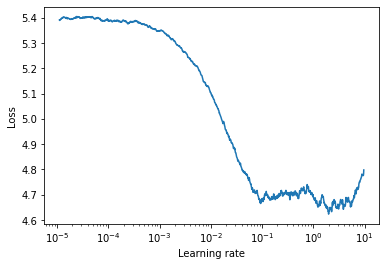

In [0]:
# LR finder
import torch.nn as nn
import torch.nn.functional as F
from eva4LRFinder import LRFinder
import torch.optim as optim
L1lambda = 1e-4
L2lambda = 1e-3
criterion = F.nll_loss
optimizer = optim.SGD(model.parameters(), lr=1e-5, weight_decay=L2lambda) #optim.Adam(model.parameters(), lr=1e-5, weight_decay=L2lambda) # 
lr_finder = LRFinder(model, optimizer, criterion, device=model.device)
lr_finder.range_test(train_loader, end_lr=10, num_iter=len(train_loader)*5)
lr_finder.plot() # to inspect the loss-learning rate graph
lr_finder.reset() # to reset the model and optimizer to their initial state

In [0]:
loss = lr_finder.history['loss']
lr = lr_finder.history['lr']
print(lr[loss.index(min(loss))])


1.9876452282952053


Using plotly so as to see the values clearly

In [0]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import graph_objs as go

def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)
  

In [0]:
def plotly_plot(x, y, title = '', xscale='linear', yscale='linear'):
    enable_plotly_in_cell()
    data = []
    trace = go.Scatter(
            x = x,
            y = y,
            mode = 'lines',
            name = title
      )
    data.append(trace)
    
    layout = dict(title = title, yaxis_type=yscale, xaxis_type=xscale)
    fig = dict(data = data, layout = layout)
    iplot(fig, show_link=False)

In [0]:
plotly_plot(lr[500:1300], loss[500:1300], "LR Range", xscale="log", yscale="log")

In [0]:
max_lr = lr[loss.index(min(loss))]
max_lr

1.9876452282952053

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Training and Testing

Looking at logs can be boring, so we'll introduce **tqdm** progressbar to get cooler logs. 

Let's write train and test functions using One Cycle Policy Scheduler. 

In [0]:
import torch.optim as optim
import torch.nn as nn
#from torch.optim.lr_scheduler import StepLR
#optimizer = torch.optim.SGD(model.parameters(), lr=0.08, momentum=0.95, weight_decay=1e-4)
L1lambda = 0
L2lambda = 1e-4
EPOCHS = 50
#max_lr=1
optimizer = optim.SGD(model.parameters(), lr=max_lr/10, momentum=0.9, nesterov=True, weight_decay=L2lambda)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=len(train_loader), div_factor=5, pct_start=0.2, epochs=EPOCHS)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train)/batch_size)+1, epochs=EPOCHS,  pct_start=5/24, div_factor=600, final_div_factor=1 )
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train_loader))+1, epochs=EPOCHS, div_factor=10 )
print("Initial LR- ",scheduler.get_lr())
print("Total steps - ", scheduler.total_steps)
print("No.of steps to increase LR -", scheduler.step_size_up)
print("No.of steps to reduce LR - ", scheduler.step_size_down)

model.gotrain(optimizer, train_loader, test_loader, EPOCHS, "/content/drive/My Drive", scheduler, True,L1lambda)

Initial LR-  [0.1987645228295205]
Total steps -  15100
No.of steps to increase LR - 4529.0
No.of steps to reduce LR -  10570.0



Validation loss decreased (100000.000000 --> 4.832723).  Saving model ...
Epoch: 1, Train set: Average loss: 0.0201, Accuracy: 1.93%; Test set: Average loss: 4.8327, Accuracy: 3.58%
Learning Rate = 0.218190



Validation loss decreased (4.832723 --> 4.468771).  Saving model ...
Epoch: 2, Train set: Average loss: 0.0182, Accuracy: 5.38%; Test set: Average loss: 4.4688, Accuracy: 7.64%
Learning Rate = 0.275623



Validation loss decreased (4.468771 --> 4.187883).  Saving model ...
Epoch: 3, Train set: Average loss: 0.0166, Accuracy: 10.60%; Test set: Average loss: 4.1879, Accuracy: 12.77%
Learning Rate = 0.368568



Validation loss decreased (4.187883 --> 3.673397).  Saving model ...
Epoch: 4, Train set: Average loss: 0.0151, Accuracy: 16.19%; Test set: Average loss: 3.6734, Accuracy: 18.97%
Learning Rate = 0.492988



Epoch: 5, Train set: Average loss: 0.0138, Accuracy: 21.07%; Test set: Average loss: 3.7693, Accuracy: 19.30%
Learning Rate = 0.643480



Validation loss decreased (3.673397 --> 3.591033).  Saving model ...
Epoch: 6, Train set: Average loss: 0.0129, Accuracy: 25.21%; Test set: Average loss: 3.5910, Accuracy: 23.56%
Learning Rate = 0.813505



Validation loss decreased (3.591033 --> 3.369395).  Saving model ...
Epoch: 7, Train set: Average loss: 0.0122, Accuracy: 28.17%; Test set: Average loss: 3.3694, Accuracy: 25.08%
Learning Rate = 0.995680



Epoch: 8, Train set: Average loss: 0.0117, Accuracy: 30.82%; Test set: Average loss: 3.8472, Accuracy: 23.12%
Learning Rate = 1.182091



Epoch: 9, Train set: Average loss: 0.0113, Accuracy: 32.75%; Test set: Average loss: 3.4547, Accuracy: 25.96%
Learning Rate = 1.364641



Validation loss decreased (3.369395 --> 3.357610).  Saving model ...
Epoch: 10, Train set: Average loss: 0.0110, Accuracy: 34.23%; Test set: Average loss: 3.3576, Accuracy: 28.40%
Learning Rate = 1.535401



Validation loss decreased (3.357610 --> 3.156562).  Saving model ...
Epoch: 11, Train set: Average loss: 0.0107, Accuracy: 35.57%; Test set: Average loss: 3.1566, Accuracy: 30.74%
Learning Rate = 1.686953



Epoch: 12, Train set: Average loss: 0.0105, Accuracy: 36.71%; Test set: Average loss: 3.5058, Accuracy: 28.22%
Learning Rate = 1.812716



Epoch: 13, Train set: Average loss: 0.0104, Accuracy: 37.18%; Test set: Average loss: 3.2201, Accuracy: 29.12%
Learning Rate = 1.907226



Epoch: 14, Train set: Average loss: 0.0102, Accuracy: 38.17%; Test set: Average loss: 3.2691, Accuracy: 28.21%
Learning Rate = 1.966378



Epoch: 15, Train set: Average loss: 0.0101, Accuracy: 38.95%; Test set: Average loss: 3.8665, Accuracy: 23.93%
Learning Rate = 1.987603



Epoch: 16, Train set: Average loss: 0.0100, Accuracy: 39.22%; Test set: Average loss: 4.9748, Accuracy: 14.68%
Learning Rate = 1.984032



Epoch: 17, Train set: Average loss: 0.0098, Accuracy: 39.94%; Test set: Average loss: 3.2812, Accuracy: 29.54%
Learning Rate = 1.972507



Validation loss decreased (3.156562 --> 3.091888).  Saving model ...
Epoch: 18, Train set: Average loss: 0.0097, Accuracy: 40.29%; Test set: Average loss: 3.0919, Accuracy: 30.86%
Learning Rate = 1.953155



Epoch: 19, Train set: Average loss: 0.0097, Accuracy: 40.71%; Test set: Average loss: 3.2930, Accuracy: 31.23%
Learning Rate = 1.926130



Validation loss decreased (3.091888 --> 3.071719).  Saving model ...
Epoch: 20, Train set: Average loss: 0.0096, Accuracy: 41.17%; Test set: Average loss: 3.0717, Accuracy: 32.52%
Learning Rate = 1.891648



Epoch: 21, Train set: Average loss: 0.0095, Accuracy: 41.96%; Test set: Average loss: 3.6103, Accuracy: 26.55%
Learning Rate = 1.849985



Validation loss decreased (3.071719 --> 3.050294).  Saving model ...
Epoch: 22, Train set: Average loss: 0.0094, Accuracy: 42.32%; Test set: Average loss: 3.0503, Accuracy: 33.82%
Learning Rate = 1.801474



Epoch: 23, Train set: Average loss: 0.0093, Accuracy: 42.82%; Test set: Average loss: 3.0549, Accuracy: 32.48%
Learning Rate = 1.746504



Validation loss decreased (3.050294 --> 3.036479).  Saving model ...
Epoch: 24, Train set: Average loss: 0.0093, Accuracy: 43.09%; Test set: Average loss: 3.0365, Accuracy: 33.73%
Learning Rate = 1.685514



Validation loss decreased (3.036479 --> 2.885060).  Saving model ...
Epoch: 25, Train set: Average loss: 0.0092, Accuracy: 43.01%; Test set: Average loss: 2.8851, Accuracy: 35.52%
Learning Rate = 1.618991



Epoch: 26, Train set: Average loss: 0.0091, Accuracy: 43.95%; Test set: Average loss: 3.0744, Accuracy: 34.09%
Learning Rate = 1.547469



Epoch: 27, Train set: Average loss: 0.0090, Accuracy: 44.25%; Test set: Average loss: 3.6321, Accuracy: 26.36%
Learning Rate = 1.471518



Validation loss decreased (2.885060 --> 2.805743).  Saving model ...
Epoch: 28, Train set: Average loss: 0.0089, Accuracy: 44.80%; Test set: Average loss: 2.8057, Accuracy: 36.87%
Learning Rate = 1.391747



Epoch: 29, Train set: Average loss: 0.0088, Accuracy: 45.46%; Test set: Average loss: 2.8954, Accuracy: 35.93%
Learning Rate = 1.308793



Epoch: 30, Train set: Average loss: 0.0087, Accuracy: 45.92%; Test set: Average loss: 2.8507, Accuracy: 36.16%
Learning Rate = 1.223320



Epoch: 31, Train set: Average loss: 0.0085, Accuracy: 46.71%; Test set: Average loss: 2.9061, Accuracy: 37.03%
Learning Rate = 1.136011



Validation loss decreased (2.805743 --> 2.567350).  Saving model ...
Epoch: 32, Train set: Average loss: 0.0084, Accuracy: 47.16%; Test set: Average loss: 2.5673, Accuracy: 40.17%
Learning Rate = 1.047565



Epoch: 33, Train set: Average loss: 0.0083, Accuracy: 47.92%; Test set: Average loss: 2.6652, Accuracy: 39.65%
Learning Rate = 0.958690



Epoch: 34, Train set: Average loss: 0.0081, Accuracy: 48.84%; Test set: Average loss: 2.9614, Accuracy: 37.11%
Learning Rate = 0.870095



Epoch: 35, Train set: Average loss: 0.0080, Accuracy: 49.63%; Test set: Average loss: 2.6390, Accuracy: 39.99%
Learning Rate = 0.782491



Validation loss decreased (2.567350 --> 2.544659).  Saving model ...
Epoch: 36, Train set: Average loss: 0.0078, Accuracy: 50.60%; Test set: Average loss: 2.5447, Accuracy: 42.34%
Learning Rate = 0.696576



Validation loss decreased (2.544659 --> 2.482298).  Saving model ...
Epoch: 37, Train set: Average loss: 0.0076, Accuracy: 52.02%; Test set: Average loss: 2.4823, Accuracy: 42.29%
Learning Rate = 0.613039



Epoch: 38, Train set: Average loss: 0.0073, Accuracy: 53.15%; Test set: Average loss: 2.5259, Accuracy: 43.61%
Learning Rate = 0.532548



Validation loss decreased (2.482298 --> 2.313218).  Saving model ...
Epoch: 39, Train set: Average loss: 0.0071, Accuracy: 54.75%; Test set: Average loss: 2.3132, Accuracy: 46.38%
Learning Rate = 0.455746



Epoch: 40, Train set: Average loss: 0.0067, Accuracy: 56.55%; Test set: Average loss: 2.3237, Accuracy: 46.39%
Learning Rate = 0.383248



Validation loss decreased (2.313218 --> 2.233699).  Saving model ...
Epoch: 41, Train set: Average loss: 0.0064, Accuracy: 58.41%; Test set: Average loss: 2.2337, Accuracy: 48.18%
Learning Rate = 0.315634



Epoch: 42, Train set: Average loss: 0.0059, Accuracy: 60.71%; Test set: Average loss: 2.3348, Accuracy: 49.22%
Learning Rate = 0.253444



Validation loss decreased (2.233699 --> 2.036523).  Saving model ...
Epoch: 43, Train set: Average loss: 0.0055, Accuracy: 63.30%; Test set: Average loss: 2.0365, Accuracy: 53.09%
Learning Rate = 0.197176



Epoch: 44, Train set: Average loss: 0.0049, Accuracy: 66.96%; Test set: Average loss: 2.0606, Accuracy: 54.41%
Learning Rate = 0.147279



Validation loss decreased (2.036523 --> 1.928537).  Saving model ...
Epoch: 45, Train set: Average loss: 0.0043, Accuracy: 70.71%; Test set: Average loss: 1.9285, Accuracy: 56.55%
Learning Rate = 0.104154



Validation loss decreased (1.928537 --> 1.880329).  Saving model ...
Epoch: 46, Train set: Average loss: 0.0036, Accuracy: 75.15%; Test set: Average loss: 1.8803, Accuracy: 58.43%
Learning Rate = 0.068144



Validation loss decreased (1.880329 --> 1.855615).  Saving model ...
Epoch: 47, Train set: Average loss: 0.0028, Accuracy: 80.44%; Test set: Average loss: 1.8556, Accuracy: 59.70%
Learning Rate = 0.039538



Validation loss decreased (1.855615 --> 1.810817).  Saving model ...
Epoch: 48, Train set: Average loss: 0.0022, Accuracy: 84.95%; Test set: Average loss: 1.8108, Accuracy: 61.18%
Learning Rate = 0.018565



Validation loss decreased (1.810817 --> 1.793626).  Saving model ...
Epoch: 49, Train set: Average loss: 0.0018, Accuracy: 88.37%; Test set: Average loss: 1.7936, Accuracy: 61.62%
Learning Rate = 0.005392



Validation loss decreased (1.793626 --> 1.788977).  Saving model ...
Epoch: 50, Train set: Average loss: 0.0016, Accuracy: 90.05%; Test set: Average loss: 1.7890, Accuracy: 61.77%
Learning Rate = 0.000125



In [0]:
for idx, group in enumerate(scheduler.optimizer.param_groups):
  print(group['initial_lr'], group['max_lr'], group['min_lr'])
  

0.19876452282952053 1.9876452282952053 1.9876452282952055e-05


In [0]:
print(max(model.stats().train_acc))
print(max(model.stats().test_acc))

0.9004805194805194
0.6177272727272727


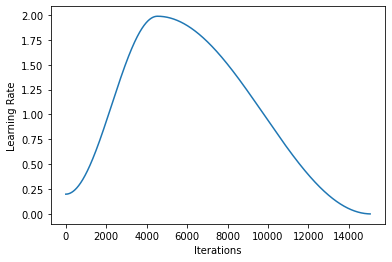

In [0]:
plt.xlabel("Iterations")
plt.ylabel("Learning Rate")
plt.plot(model.stats().batch_lr)
plt.show()

# Accuracy curves

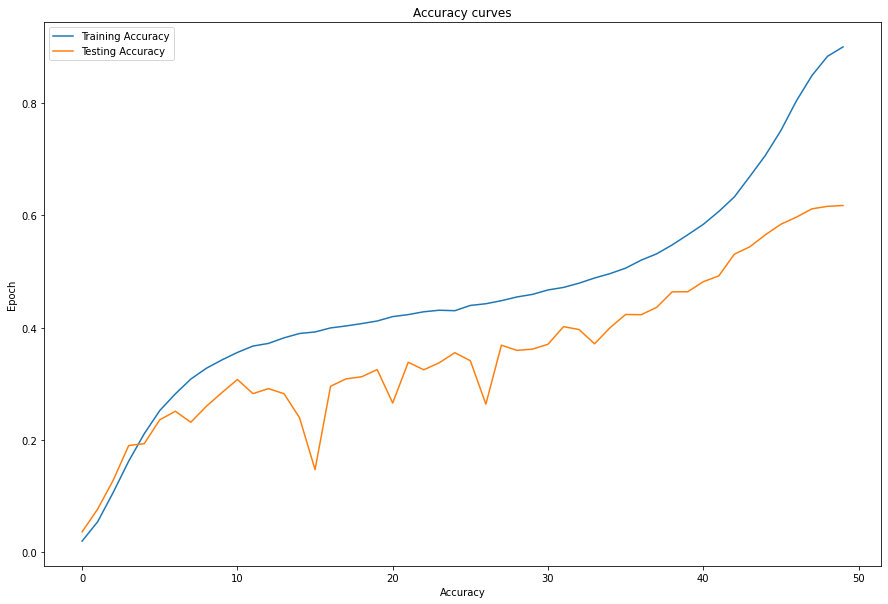

In [0]:
plt.figure(figsize=(15, 10))
ax = plt.subplot(111)
ax.plot(model.stats().train_acc)
ax.plot(model.stats().test_acc)

ax.set(title="Accuracy curves", xlabel="Accuracy", ylabel="Epoch")
ax.legend(['Training Accuracy', 'Testing Accuracy'], loc='best')
plt.savefig("TrainTestAccuracy.png")
plt.show()

# Misclassified images

/content/EVALibrary/EVA4/plots.py:31: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



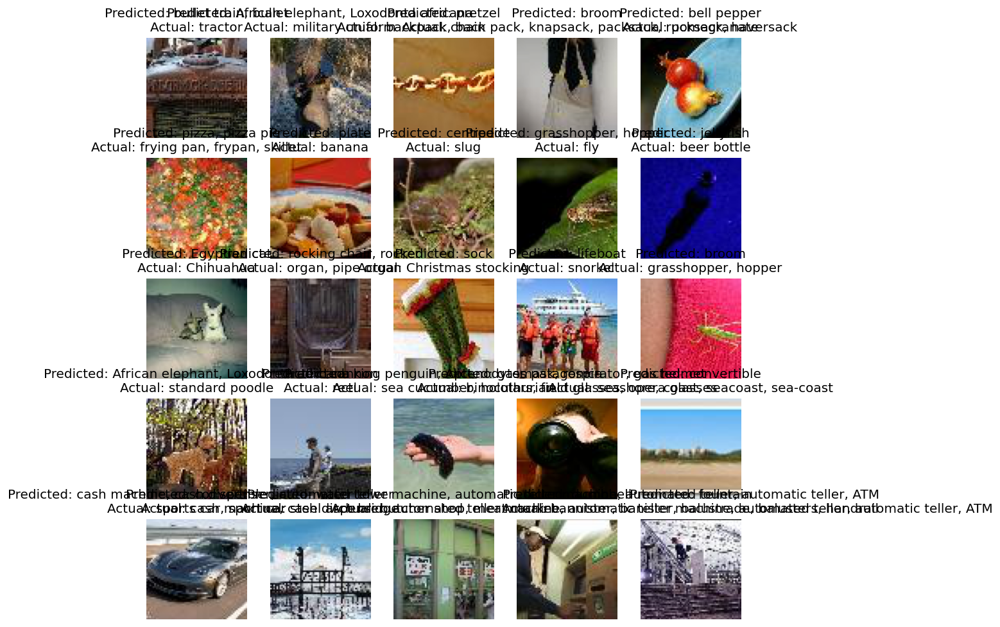

In [0]:

import plots


plots.plot_images(model.stats().get_misclassified_images(), class_names, "misclassified_imgs.png", mean=list(channel_means), std=list(channel_stdevs))


# GradCAM for misclassified images

In [0]:
mimages = model.stats().get_misclassified_images()
images = []
target_classes = []
pred_classes = []
for i in mimages:
  images.append(i["img"].cpu())
  target_classes.append(int(i['target']))
  pred_classes.append(int(i['pred']))

In [0]:
print(target_classes)
print(pred_classes)

[75, 169, 171, 38, 170, 86, 46, 100, 113, 50, 182, 19, 123, 111, 180, 194, 1, 37, 197, 25, 117, 130, 99, 106, 189]
[69, 199, 40, 124, 188, 16, 143, 161, 180, 94, 0, 3, 47, 196, 124, 199, 80, 41, 83, 157, 157, 109, 106, 154, 140]


torch.Size([10, 200])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)


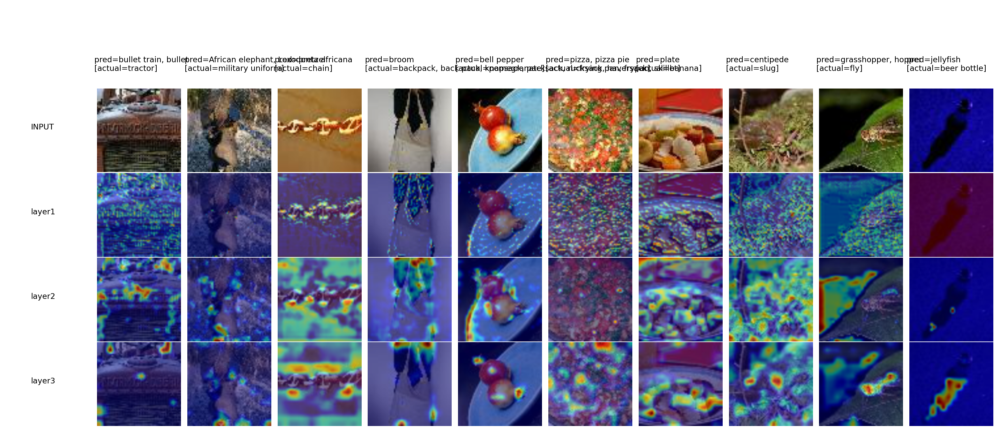

torch.Size([10, 200])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)


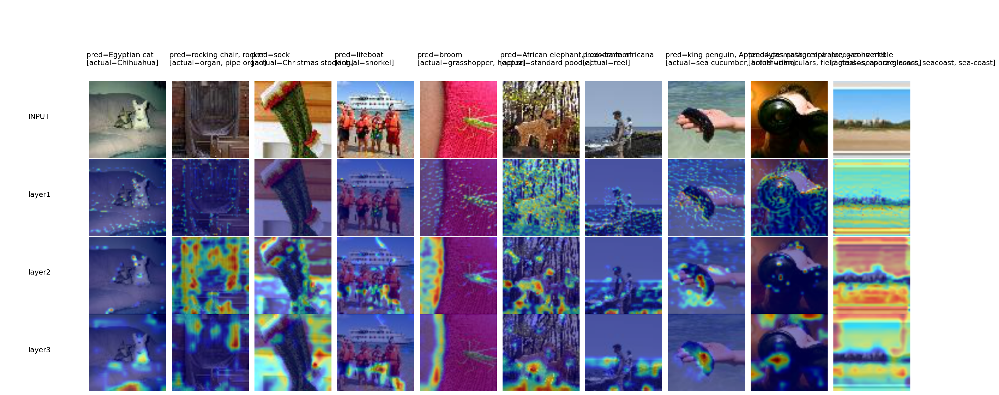

torch.Size([5, 200])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)
(3, 64, 64)


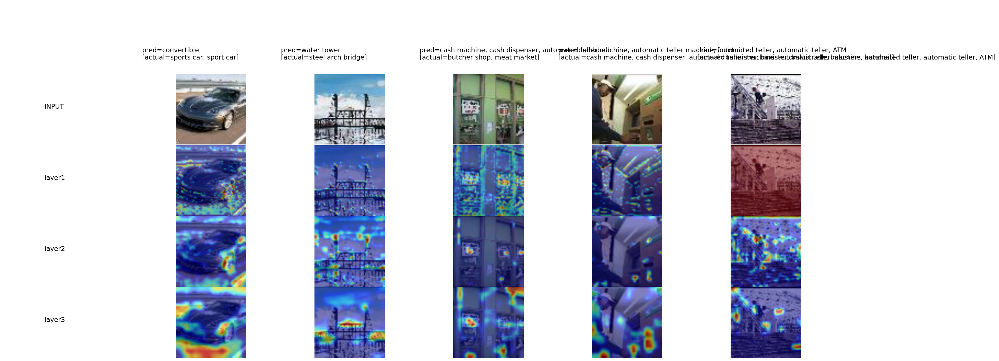

In [0]:
from eva4gradcam import GRADCAM, PLOT
target_layers = ["layer1", "layer2", "layer3"]
#Gradcam plot for first 10 misclassified images
gradcam_output, probs, predicted_classes = GRADCAM(images[:10], target_classes[:10], model, target_layers)
PLOT(gradcam_output, images[:10], target_classes[:10], target_layers, class_names, (3, 64, 64), predicted_classes, unnormalize)
#Gradcam plot for 11-20 misclassified images
gradcam_output, probs, predicted_classes = GRADCAM(images[10:20], target_classes[10:20], model, target_layers)
PLOT(gradcam_output, images[10:20], target_classes[10:20], target_layers, class_names, (3, 64, 64), predicted_classes, unnormalize)
#Gradcam plot for 21-25 misclassified images
gradcam_output, probs, predicted_classes = GRADCAM(images[20:], target_classes[20:], model, target_layers)
PLOT(gradcam_output, images[20:], target_classes[20:], target_layers, class_names, (3, 64, 64), predicted_classes, unnormalize)